## Effects Delay Design

The delay effect in our current project could be drawn in following block diagram.

<img align="center" width=50% src="musical_delay.png" alt>

Delay line in $M$ samples with $b_0$ gain feedback, it could be derived as below equation, we assume $w(n)$ is located before the delay block but after the sum of input $x(n)$ and feedback line:

$$
w(n) = x(n) + b_0 y(n) \tag{1.1}
$$

$$
w(n-M) = y(n) \tag{1.2}
$$

with above equation, we can transfer $1.1$, $1.2$ into Z-domain:

$$
W(z) = X(z) + b_0 Y(z) \tag{2.1}
$$

$$
W(z)z^{-M} = Y(z) \tag{2.2}
$$

now we can eliminate $W(z)$ by $2.1$ $2.2$:

$$
(X(z) + b_0 Y(z)) z^{-M} = Y(z) \tag{3}
$$

$$
X(z) z^{-M} + b_0 Y(z) z^{-M} = Y(z) \tag{4}
$$

$$
X(z) z^{-M} = Y(z) (1 - b_0 z^{-M}) \tag{5}
$$

Finally, we can get the corresponding transfer function:

$$
H(z) = \frac{Y(z)}{X(z)} = \frac{z^{-M}}{1-b_0 z^{-M}} \tag{6}
$$

An improvement version of algorithm could be drawn as following block diagram:

<img align="center" width=60% src="musical_delay_apf.png" alt>

Delay line in $M$ samples and $b_0$ gain feedback line within **Schroeder allpass sections**, a kind of filter that cascaded 3 allpass filter($G_1(z)$, $G_2(z)$, $G_3(z)$), we could just simply assign $g(n)$ to this section as time domain and $G(z)$ as z-domain, this design will end up smearing out the metallic sound in the feedback loop when the $b_0$ is getting bigger and bigger. On the other hand, a lowpass filter $l(n)$ will be implemented to kill/compress the muddy sound after $y(n)$ output. Therfore, musician could have a wider range to manuplite the parameter ($M$, $b_0$ and $l(n)$'s cutoff frequency) on the delay effect. The design could be derived as below equation:


$$
w(n) = x(n) + b_0 g(n) y(n) \tag{1.1}
$$

$$
w(n-M) = y(n) \tag{1.2}
$$

transfer $1.1$, $1.2$ into Z-domain:

$$
W(z) = X(z) + b_0 G(z) Y(z) \tag{2.1}
$$

$$
W(z)z^{-M} = Y(z) \tag{2.2}
$$

finally we can eliminate $W(z)$:

$$
(X(z) + b_0 G(z) Y(z)) z^{-M} = Y(z) \tag{3}
$$

$$
X(z) z^{-M} + b_0 G(z) Y(z) z^{-M} = Y(z) \tag{4}
$$

$$
X(z) z^{-M} = Y(z) (1 - b_0 G(z) z^{-M}) \tag{5}
$$

now we can get the corresponding transfer function:

$$
H(z) = \frac{Y(z)}{X(z)} = \frac{z^{-M}}{1 - b_0 G(z) z^{-M}} \tag{6}
$$

$G(z)$ which is an allpass section, it could be expanded as $G_1(z)$, $G_2(z)$, $G_3(z)$. The gain factor of each allpass filter is $g_1 = 0.7$, $g_2 = 0.7$, $g_3 = 0.7$ and delay sample is $M_1 = 113$, $M_2 = 337$, $M_3 = 1051$.

$$\begin{align}
H(z) &= \frac {z^{-M}}{1-(\frac{g_1 + z^{-M_1}}{1+g_1z^{-M_1}})(\frac{g_2 + z^{-M_2}}{1+g_2z^{-M_2}})(\frac{g_3 + z^{-M_3}}{1+g_3z^{-M_3}}) b_0 z^{-M}}
\\&= 
\frac 
{(1+g_1z^{-M_1})(1+g_2z^{-M_2})(1+g_3z^{-M_3})z^{-M}}
{(1+g_1z^{-M_1})(1+g_2z^{-M_2})(1+g_3z^{-M_3})-(g_1 + z^{-M_1})(g_2 + z^{-M_2})(g_3 + z^{-M_3}) b_0 z^{-M}} \tag{7}
\end{align}$$

with the equation expansion, our transfer function could be derived in a polynomial equation:

$$
H(z) = \frac{{z^{-8192}}+{0.7}{z^{-9243}}+{0.7}{z^{-8529}}+{0.49}{z^{-9580}}+{0.7}{z^{-8305}}+{0.49}{z^{-9356}}+{0.49}{z^{-8642}}+{0.343}{z^{-9693}}}{1+{0.7}{z^{-1051}}+{0.7}{z^{-337}}+{0.49}{z^{-1388}}+{0.7}{z^{-113}}+{0.49}{z^{-1164}}+{0.49}{z^{-450}}+{0.343}{z^{-1501}}-b_0({0.343}{z^{-8192}}+{0.49}{z^{-9243}}+{0.49}{z^{-8529}}+{0.7}{z^{-9580}}+{0.49}{z^{-8305}}+{0.7}{z^{-9356}}+{0.7}{z^{-8642}}+{z^{-9693}})} \tag{8}
$$

In [12]:
from math import pi
import numpy as np
import scipy.signal
import matplotlib.pyplot as plt
import wavio
import IPython

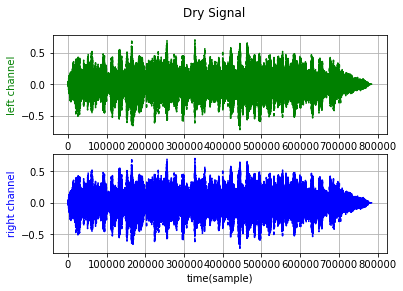

In [13]:
sr = 48000

wav = wavio.read("Acoustic_Guitar.wav")

left_channel = wav.data[:, 0]
left_channel = left_channel.astype(np.float32, order='C') / 32767.0

right_channel = wav.data[:, 1]
right_channel = right_channel.astype(np.float32, order='C') / 32767.0

x_axis = np.arange(len(left_channel))

plt.figure(1)
plt.suptitle('Dry Signal')

plt.subplot(211)
plt.plot(x_axis, left_channel, 'g--')
plt.ylabel('left channel', color='g')
plt.grid()

plt.subplot(212)
plt.plot(x_axis, left_channel, 'b--')
plt.ylabel('right channel', color='b')
plt.grid()

plt.xlabel(r'time(sample)')

plt.show()

IPython.display.display(IPython.display.Audio("Acoustic_Guitar.wav", rate=sr))

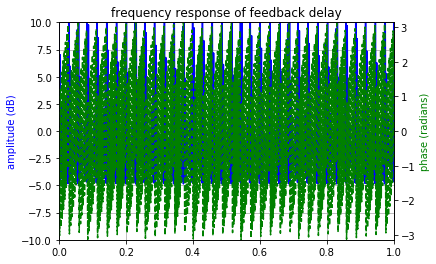

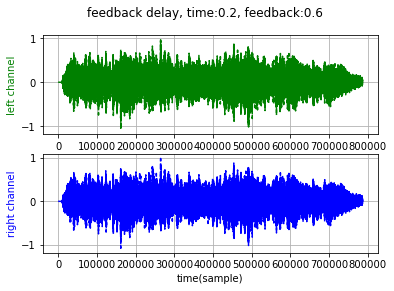

In [14]:
delaysample = 9693
arraysize = delaysample+1
feedbackgain = 0.75

numerator = np.zeros(arraysize)
denominator = np.zeros(arraysize)

numerator[delaysample] = 1

denominator[0] = 1
denominator[delaysample] = -feedbackgain

w, h = scipy.signal.freqz(numerator, denominator)
amp = 20 * np.log10(abs(h))
deg = np.angle(h)

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.title('frequency response of feedback delay')
plt.xlabel(r'normalized frequency (x$\pi$rad/sample)')

ax1.plot(w/max(w), amp, 'b')
ax1.set_xlim(0, 1)
ax1.set_ylim(-10, 10)
ax1.set_ylabel('amplitude (dB)', color='b')
ax1.grid()

ax2.plot(w/max(w), deg, 'g--')
ax2.set_xlim(0, 1)
ax2.set_ylim(-pi, pi)
ax2.set_ylabel('phase (radians)', color='g')

plt.show()

left_output = scipy.signal.lfilter(numerator, denominator, left_channel)
right_output = scipy.signal.lfilter(numerator, denominator, right_channel)

output = np.zeros((len(left_output), 2))
output[:, 0] = left_output
output[:, 1] = right_output
wavio.write("delay_feedback_9693_55.wav", output, sr, sampwidth=3)

x_axis = np.arange(len(left_output))

plt.figure(1)
plt.suptitle('feedback delay, time:0.2, feedback:0.6')

plt.subplot(211)
plt.plot(x_axis, left_output, 'g--')
plt.ylabel('left channel', color='g')
plt.grid()

plt.subplot(212)
plt.plot(x_axis, right_output, 'b--')
plt.ylabel('right channel', color='b')
plt.grid()

plt.xlabel(r'time(sample)')

plt.show()

IPython.display.display(IPython.display.Audio("delay_feedback_9693_55.wav", rate=sr))